In [1]:
import numpy as np
import torch
import matplotlib
import matplotlib.pyplot as plt
import requests
import skimage.io
from PIL import Image
from pathlib import Path
from pycocotools.coco import COCO

%matplotlib inline

## CoCo Explore

In [0]:
coco_annotation_file_path = "/sda1/Datasets/CoCo/annotations/instances_val2017.json"
coco_annotation = COCO(annotation_file=coco_annotation_file_path)

In [10]:
# Category IDs.
cat_ids = coco_annotation.getCatIds()
print(f"Number of Unique Categories: {len(cat_ids)}")
print("Category IDs:")
print(cat_ids)  # The IDs are not necessarily consecutive.

# All categories.
cats = coco_annotation.loadCats(cat_ids)
cat_names = [cat["name"] for cat in cats]
print("Categories Names:")
print(cat_names)

# Category ID -> Category Name.
query_id = cat_ids[0]
query_annotation = coco_annotation.loadCats([query_id])[0]
query_name = query_annotation["name"]
query_supercategory = query_annotation["supercategory"]
print("Category ID -> Category Name:")
print(
    f"Category ID: {query_id}, Category Name: {query_name}, Supercategory: {query_supercategory}"
)

# Category Name -> Category ID.
query_name = cat_names[2]
query_id = coco_annotation.getCatIds(catNms=[query_name])[0]
print("Category Name -> ID:")
print(f"Category Name: {query_name}, Category ID: {query_id}")

# Get the ID of all the images containing the object of the category.
img_ids = coco_annotation.getImgIds(catIds=[query_id])
print(f"Number of Images Containing {query_name}: {len(img_ids)}")

# Pick one image.
img_id = img_ids[2]
img_info = coco_annotation.loadImgs([img_id])[0]
img_file_name = img_info["file_name"]
img_url = img_info["coco_url"]
print(
    f"Image ID: {img_id}, File Name: {img_file_name}, Image URL: {img_url}"
)

# Get all the annotations for the specified image.
ann_ids = coco_annotation.getAnnIds(imgIds=[img_id], iscrowd=None)
anns = coco_annotation.loadAnns(ann_ids)
print(f"Annotations for Image ID {img_id}:")
print(anns)

Number of Unique Categories: 80
Category IDs:
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 67, 70, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 84, 85, 86, 87, 88, 89, 90]
Categories Names:
['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted

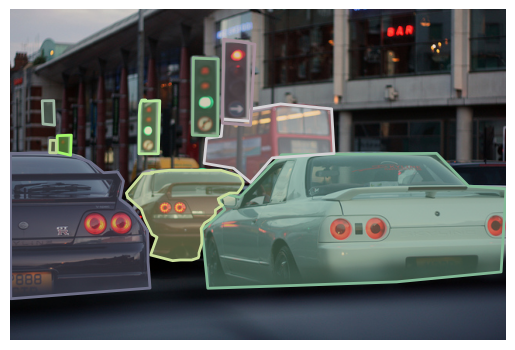

In [9]:
# Show the image.
# Use URL to load image.
im = Image.open(requests.get(img_url, stream=True).raw)

# Save image and its labeled version.
plt.axis("off")
plt.imshow(np.asarray(im))
# plt.savefig(f"{img_id}.jpg", bbox_inches="tight", pad_inches=0)
# Plot segmentation and bounding box.
coco_annotation.showAnns(anns, draw_bbox=False)
# plt.savefig(f"{img_id}_annotated.jpg", bbox_inches="tight", pad_inches=0)

## Choose a category and show all images containing that category

Number of Images Containing car: 535
Image ID: 532481, File Name: 000000532481.jpg, Image URL: http://images.cocodataset.org/val2017/000000532481.jpg
Annotations for Image ID 532481:


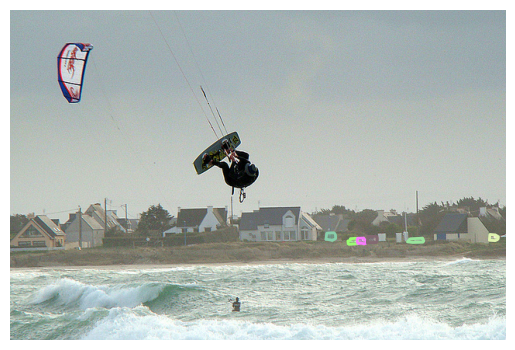

Image ID: 184324, File Name: 000000184324.jpg, Image URL: http://images.cocodataset.org/val2017/000000184324.jpg
Annotations for Image ID 184324:


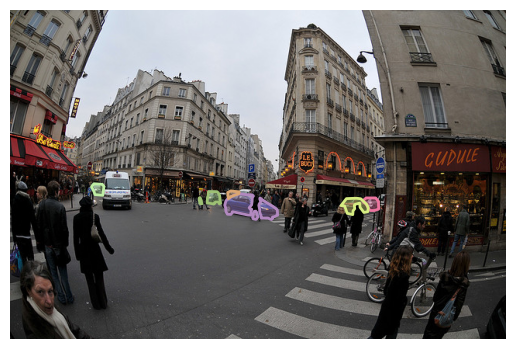

Image ID: 454661, File Name: 000000454661.jpg, Image URL: http://images.cocodataset.org/val2017/000000454661.jpg
Annotations for Image ID 454661:


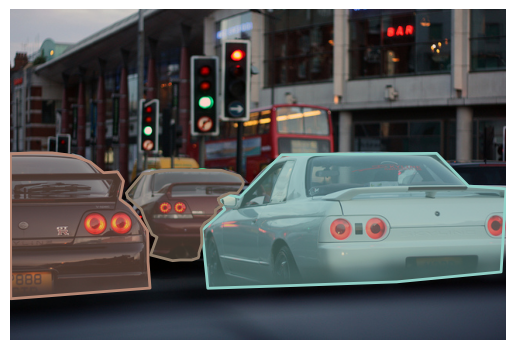

Image ID: 546823, File Name: 000000546823.jpg, Image URL: http://images.cocodataset.org/val2017/000000546823.jpg
Annotations for Image ID 546823:


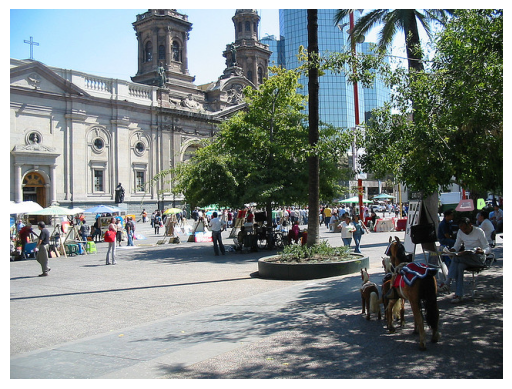

Image ID: 393226, File Name: 000000393226.jpg, Image URL: http://images.cocodataset.org/val2017/000000393226.jpg
Annotations for Image ID 393226:


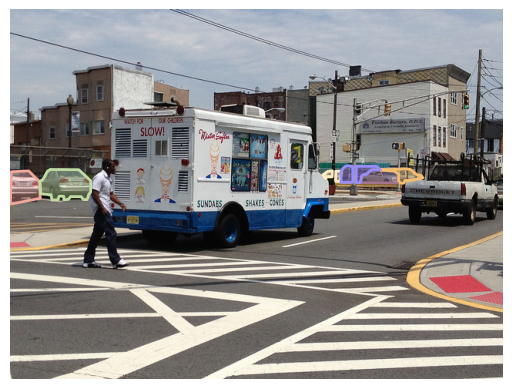

Image ID: 102411, File Name: 000000102411.jpg, Image URL: http://images.cocodataset.org/val2017/000000102411.jpg
Annotations for Image ID 102411:


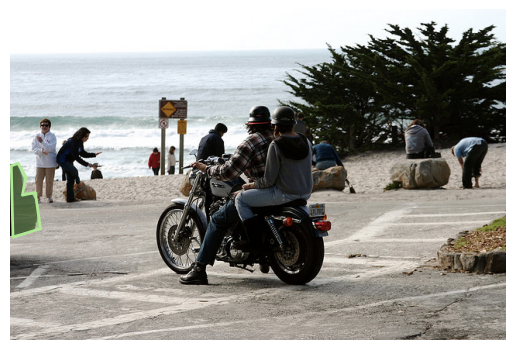

Image ID: 169996, File Name: 000000169996.jpg, Image URL: http://images.cocodataset.org/val2017/000000169996.jpg
Annotations for Image ID 169996:


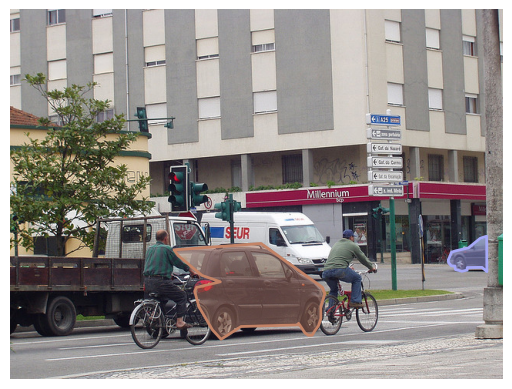

Image ID: 67616, File Name: 000000067616.jpg, Image URL: http://images.cocodataset.org/val2017/000000067616.jpg
Annotations for Image ID 67616:


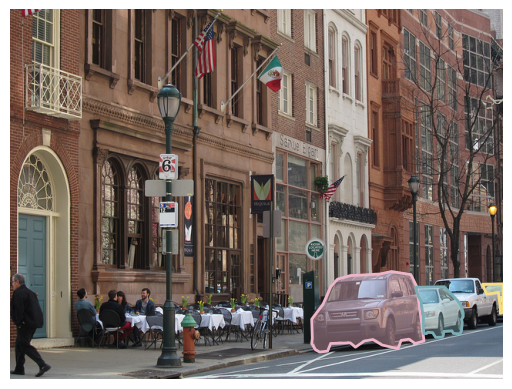

Image ID: 530470, File Name: 000000530470.jpg, Image URL: http://images.cocodataset.org/val2017/000000530470.jpg
Annotations for Image ID 530470:


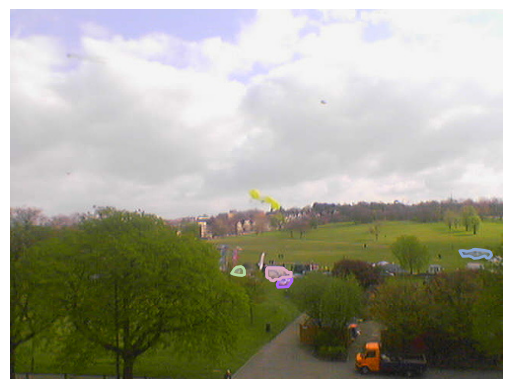

Image ID: 397351, File Name: 000000397351.jpg, Image URL: http://images.cocodataset.org/val2017/000000397351.jpg
Annotations for Image ID 397351:


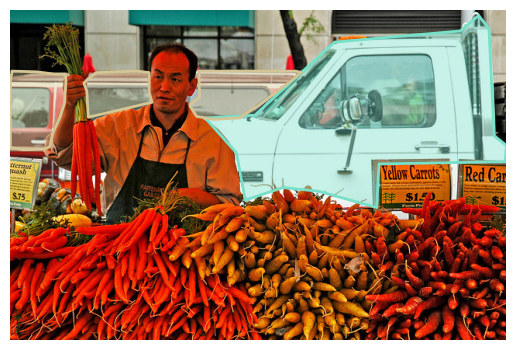

Image ID: 555050, File Name: 000000555050.jpg, Image URL: http://images.cocodataset.org/val2017/000000555050.jpg
Annotations for Image ID 555050:


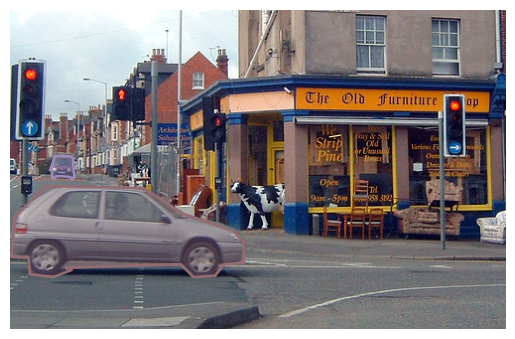

Image ID: 477227, File Name: 000000477227.jpg, Image URL: http://images.cocodataset.org/val2017/000000477227.jpg
Annotations for Image ID 477227:


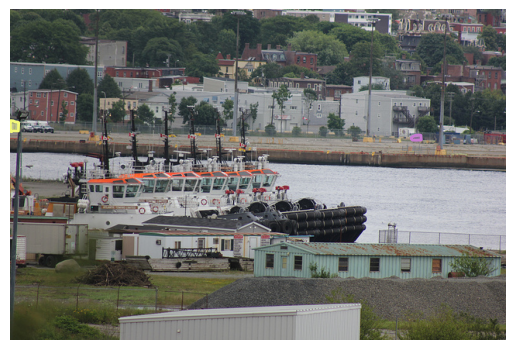

Image ID: 14380, File Name: 000000014380.jpg, Image URL: http://images.cocodataset.org/val2017/000000014380.jpg
Annotations for Image ID 14380:


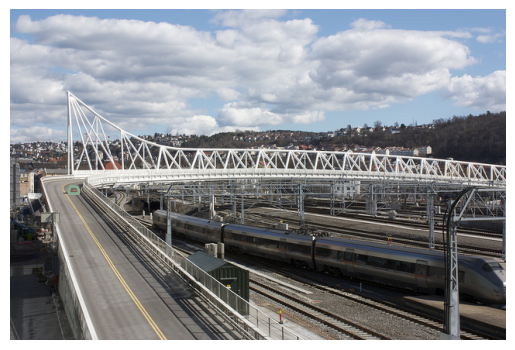

Image ID: 284725, File Name: 000000284725.jpg, Image URL: http://images.cocodataset.org/val2017/000000284725.jpg
Annotations for Image ID 284725:


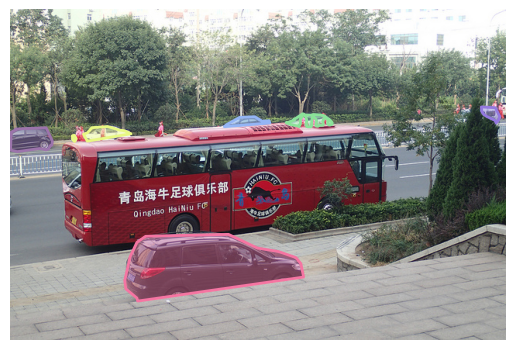

Image ID: 526392, File Name: 000000526392.jpg, Image URL: http://images.cocodataset.org/val2017/000000526392.jpg
Annotations for Image ID 526392:


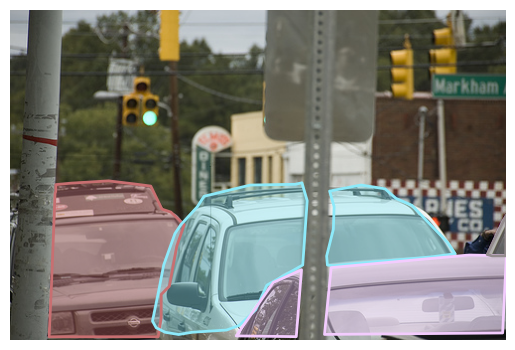

Image ID: 499768, File Name: 000000499768.jpg, Image URL: http://images.cocodataset.org/val2017/000000499768.jpg
Annotations for Image ID 499768:


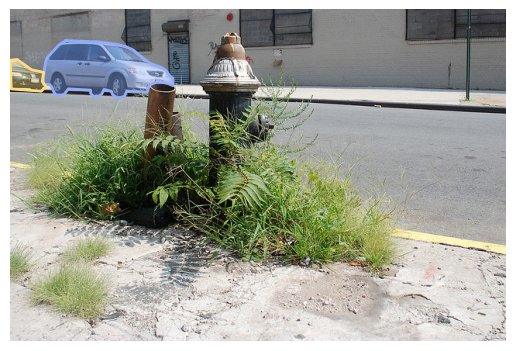

Image ID: 315450, File Name: 000000315450.jpg, Image URL: http://images.cocodataset.org/val2017/000000315450.jpg
Annotations for Image ID 315450:


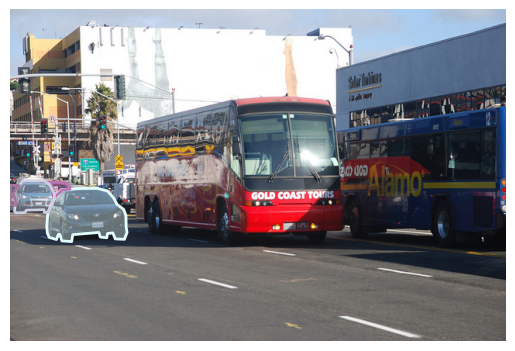

Image ID: 157756, File Name: 000000157756.jpg, Image URL: http://images.cocodataset.org/val2017/000000157756.jpg
Annotations for Image ID 157756:


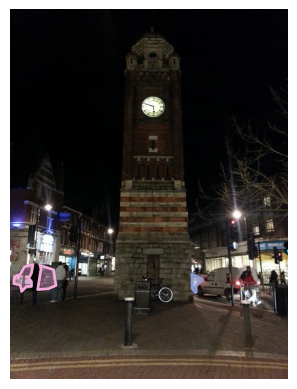

Image ID: 499775, File Name: 000000499775.jpg, Image URL: http://images.cocodataset.org/val2017/000000499775.jpg
Annotations for Image ID 499775:


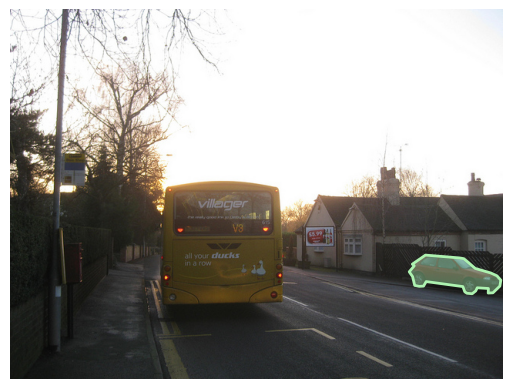

Image ID: 507975, File Name: 000000507975.jpg, Image URL: http://images.cocodataset.org/val2017/000000507975.jpg
Annotations for Image ID 507975:


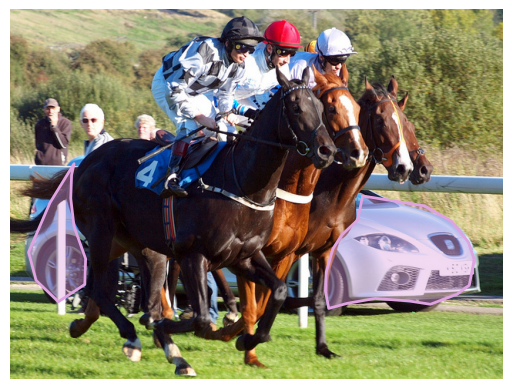

Image ID: 204871, File Name: 000000204871.jpg, Image URL: http://images.cocodataset.org/val2017/000000204871.jpg
Annotations for Image ID 204871:


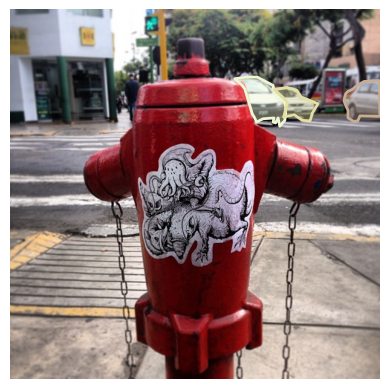

Image ID: 356424, File Name: 000000356424.jpg, Image URL: http://images.cocodataset.org/val2017/000000356424.jpg
Annotations for Image ID 356424:


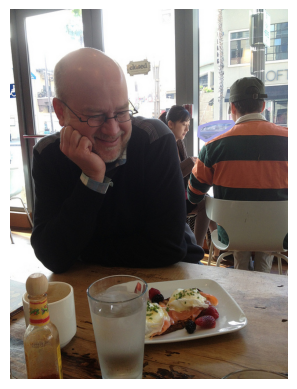

Image ID: 301135, File Name: 000000301135.jpg, Image URL: http://images.cocodataset.org/val2017/000000301135.jpg
Annotations for Image ID 301135:


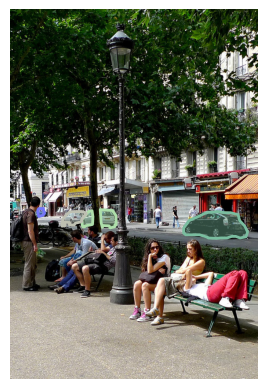

Image ID: 114770, File Name: 000000114770.jpg, Image URL: http://images.cocodataset.org/val2017/000000114770.jpg
Annotations for Image ID 114770:


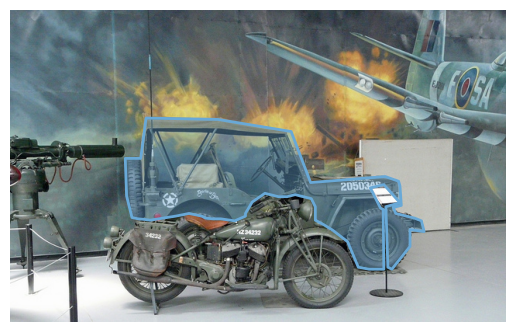

Image ID: 231508, File Name: 000000231508.jpg, Image URL: http://images.cocodataset.org/val2017/000000231508.jpg
Annotations for Image ID 231508:


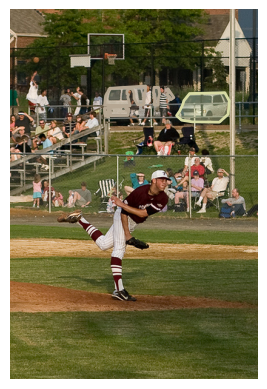

Image ID: 505942, File Name: 000000505942.jpg, Image URL: http://images.cocodataset.org/val2017/000000505942.jpg
Annotations for Image ID 505942:


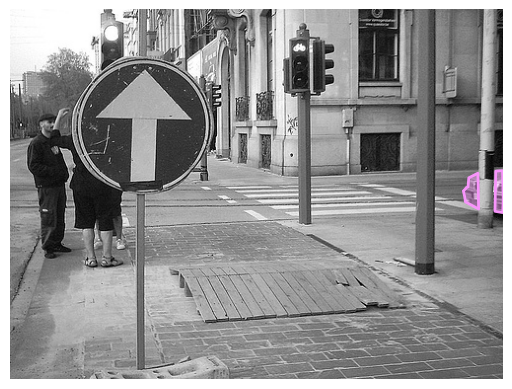

Image ID: 98392, File Name: 000000098392.jpg, Image URL: http://images.cocodataset.org/val2017/000000098392.jpg
Annotations for Image ID 98392:


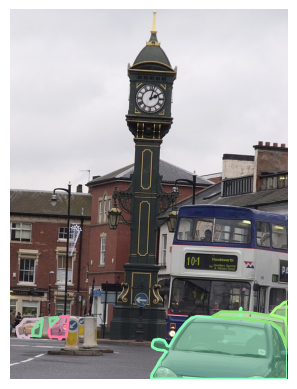

Image ID: 442456, File Name: 000000442456.jpg, Image URL: http://images.cocodataset.org/val2017/000000442456.jpg
Annotations for Image ID 442456:


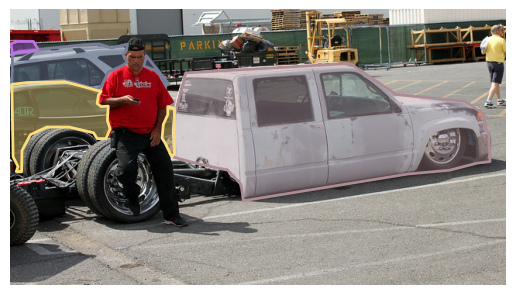

Image ID: 30828, File Name: 000000030828.jpg, Image URL: http://images.cocodataset.org/val2017/000000030828.jpg
Annotations for Image ID 30828:


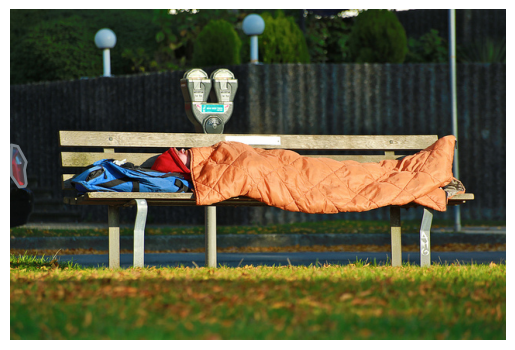

Image ID: 534639, File Name: 000000534639.jpg, Image URL: http://images.cocodataset.org/val2017/000000534639.jpg
Annotations for Image ID 534639:


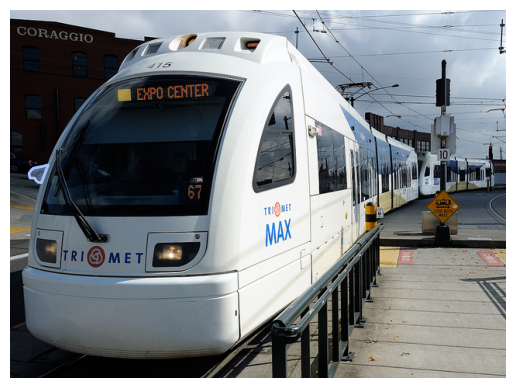

Image ID: 342128, File Name: 000000342128.jpg, Image URL: http://images.cocodataset.org/val2017/000000342128.jpg
Annotations for Image ID 342128:


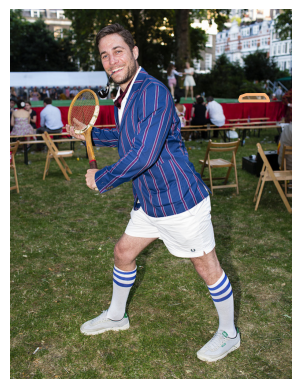

Image ID: 127092, File Name: 000000127092.jpg, Image URL: http://images.cocodataset.org/val2017/000000127092.jpg
Annotations for Image ID 127092:


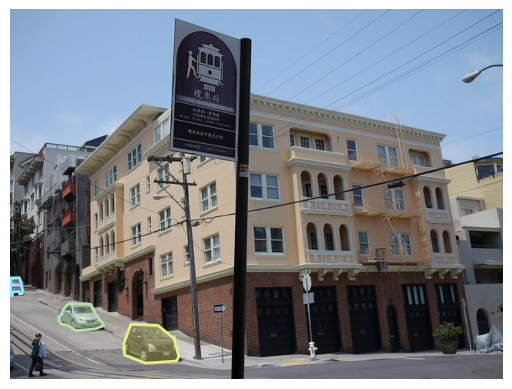

Image ID: 319607, File Name: 000000319607.jpg, Image URL: http://images.cocodataset.org/val2017/000000319607.jpg
Annotations for Image ID 319607:


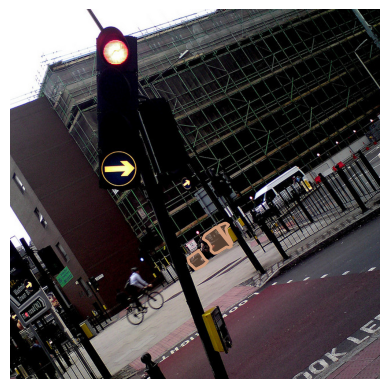

Image ID: 346232, File Name: 000000346232.jpg, Image URL: http://images.cocodataset.org/val2017/000000346232.jpg
Annotations for Image ID 346232:


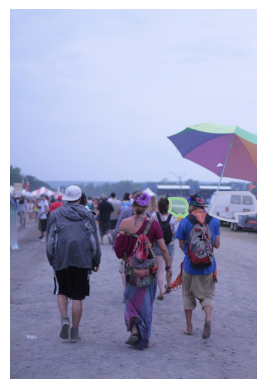

Image ID: 391290, File Name: 000000391290.jpg, Image URL: http://images.cocodataset.org/val2017/000000391290.jpg
Annotations for Image ID 391290:


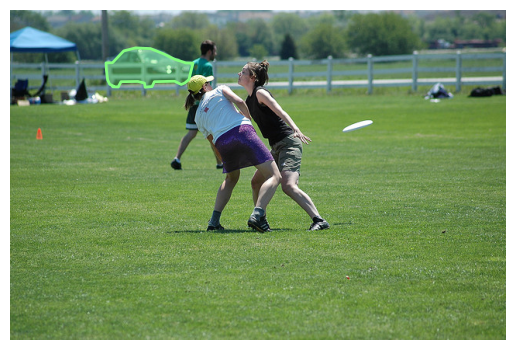

Image ID: 10363, File Name: 000000010363.jpg, Image URL: http://images.cocodataset.org/val2017/000000010363.jpg
Annotations for Image ID 10363:


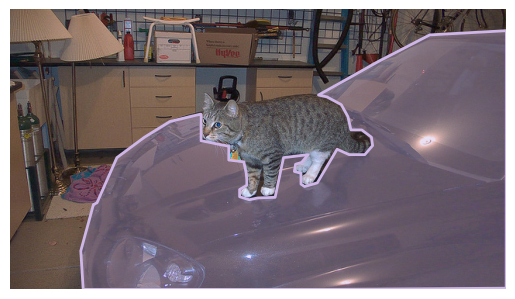

Image ID: 292997, File Name: 000000292997.jpg, Image URL: http://images.cocodataset.org/val2017/000000292997.jpg
Annotations for Image ID 292997:


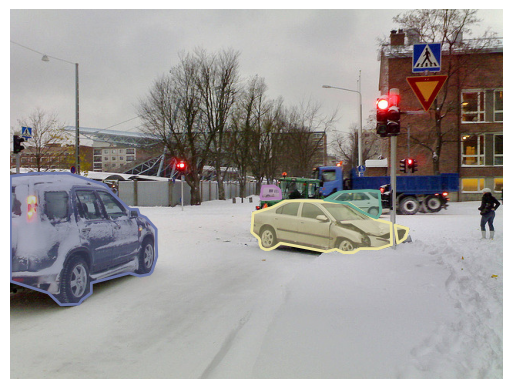

Image ID: 309391, File Name: 000000309391.jpg, Image URL: http://images.cocodataset.org/val2017/000000309391.jpg
Annotations for Image ID 309391:


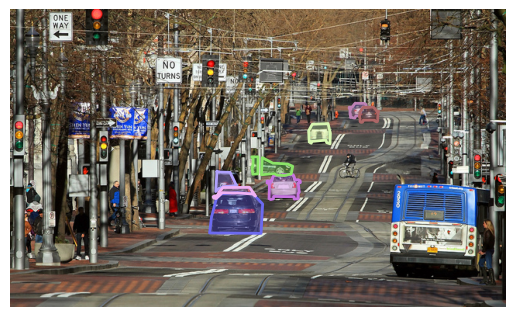

Image ID: 565391, File Name: 000000565391.jpg, Image URL: http://images.cocodataset.org/val2017/000000565391.jpg
Annotations for Image ID 565391:


KeyboardInterrupt: 

In [12]:
# Choose a category.
cat_name = "car"
cat_ids = coco_annotation.getCatIds(catNms=[cat_name])
img_ids = coco_annotation.getImgIds(catIds=cat_ids)
print(f"Number of Images Containing {cat_name}: {len(img_ids)}")

# Show all images containing the category.
for img_id in img_ids:
    img_info = coco_annotation.loadImgs([img_id])[0]
    img_file_name = img_info["file_name"]
    img_url = img_info["coco_url"]
    print(
        f"Image ID: {img_id}, File Name: {img_file_name}, Image URL: {img_url}"
    )

    # Get all the annotations for the specified image.
    ann_ids = coco_annotation.getAnnIds(imgIds=[img_id], catIds=cat_ids, iscrowd=None)
    anns = coco_annotation.loadAnns(ann_ids)
    print(f"Annotations for Image ID {img_id}:")
    # print(anns)

    # Show the image.
    # Use URL to load image.
    im = Image.open(requests.get(img_url, stream=True).raw)

    # Save image and its labeled version.
    plt.axis("off")
    plt.imshow(np.asarray(im))
    # plt.savefig(f"{img_id}.jpg", bbox_inches="tight", pad_inches=0)
    # Plot segmentation and bounding box.
    coco_annotation.showAnns(anns, draw_bbox=False)
    plt.show()
    plt.close()
    # plt.savefig(f"{img_id}_annotated.jpg", bbox_inches="tight", pad_inches=0)



## CoCo-Stuff Explore

loading annotations into memory...
Done (t=0.36s)
creating index...
index created!
COCO Stuff leaf categories: 
 banner blanket branch bridge building-other bush cabinet cage cardboard carpet ceiling-other ceiling-tile cloth clothes clouds counter cupboard curtain desk-stuff dirt door-stuff fence floor-marble floor-other floor-stone floor-tile floor-wood flower fog food-other fruit furniture-other grass gravel ground-other hill house leaves light mat metal mirror-stuff moss mountain mud napkin net paper pavement pillow plant-other plastic platform playingfield railing railroad river road rock roof rug salad sand sea shelf sky-other skyscraper snow solid-other stairs stone straw structural-other table tent textile-other towel tree vegetable wall-brick wall-concrete wall-other wall-panel wall-stone wall-tile wall-wood water-other waterdrops window-blind window-other wood other
COCO Stuff super categories: 
 building ceiling floor food-stuff furniture-stuff ground other plant raw-material

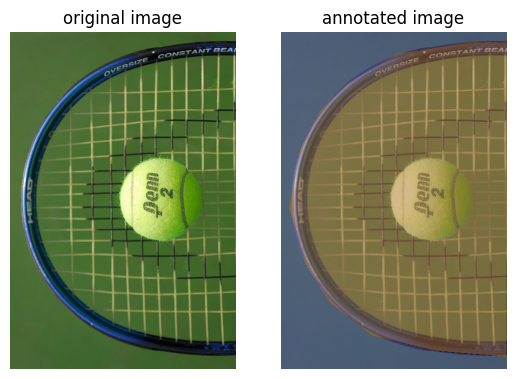

In [8]:
annFile = '/sda1/Datasets/CoCo/annotations/stuff_val2017.json'

# Initialize COCO ground truth API
cocoGt = COCO(annFile)

# Display COCO stuff categories and supercategories
categories = cocoGt.loadCats(cocoGt.getCatIds())
categoryNames = [cat['name'] for cat in categories]
print ('COCO Stuff leaf categories: \n', ' '.join(categoryNames))

superCategoryNames = sorted(set([cat['supercategory'] for cat in categories]))
print ('COCO Stuff super categories: \n', ' '.join(superCategoryNames))

# Load info for a random image
imgIds = cocoGt.getImgIds()
imgId = imgIds[np.random.randint(0, len(imgIds))]
print ('Processing image', imgId, '\n')
img = cocoGt.loadImgs(imgId)[0]

# Load and display image
I = skimage.io.imread(img['coco_url'])
plt.figure()
plt.subplot(121)
plt.imshow(I)
plt.axis('off')
plt.title('original image')

# Load and display stuff annotations
annIds = cocoGt.getAnnIds(imgIds=img['id'])
anns = cocoGt.loadAnns(annIds)
plt.subplot(122)
plt.imshow(I)
cocoGt.showAnns(anns)
plt.axis('off')
plt.title('annotated image')
plt.show()